# pySLMSorting Example

In [1]:
%load_ext autoreload
%autoreload 2

In [14]:
import sys
from pyslmsorting import PhaseMaskGenerator

import numpy as np
import timeit

import matplotlib.pyplot as plt
from PIL import Image

zfactor = 1  # Zero-padding factor
height = 1024  # Chip dim 1
width = 1024  # Chip dimension 2

# Init instance and load kernels.
pmg = PhaseMaskGenerator(
    int(width*zfactor),
    int(height*zfactor)
)

Selected device:  Intel(R) Graphics
{'app': None, 'config': None, 'fast_axis': 1, 'shape': [1024, 1024], 'n_batch': 1, 'skip_axis': [False, False], 'ndim': 2, 'axes0': [1, 0], 'shape0': (1024, 1024), 'strides0': None, 'inplace': True, 'r2c': False, 'r2c_odd': False, 'dct': 0, 'dst': 0, 'tmp_buffer_nbytes': 0, 'use_bluestein_fft': None, 'nb_axis_upload': None, 'forceCallbackVersionRealTransforms': -1, 'disableReorderFourStep': -1, 'coalescedMemory': -1, 'numSharedBanks': -1, 'aimThreads': -1, 'performBandwidthBoost': -1, 'registerBoost': -1, 'registerBoostNonPow2': -1, 'registerBoost4Step': -1, 'warpSize': -1, 'groupedBatch': [-1, -1, -1], 'use_lut': -1, 'keepShaderCode': -1, 'norm': 1, 'precision': 4, 'queue': <pyopencl._cl.CommandQueue object at 0x000001B0ED5E7630>}


## Creating Hologram
In the first part of this code we will use the PMG class to create a hologram for a defined pattern. We start by setting a geometry of spots and then run the optimizer to give us a hologram that we can then save.  

### Define the spot pattern

We need to define some geometry for the spots. We can use `pmg.addSpot()` for that, which takes a tuple of coordinates `[x, y, z, I, psi]`. In this example, we define a 3x3 array with spacing of 12 Fourier units.

In [15]:
# Create some spot pattern, e.g. n_x x n_y square grid in center.
pmg.spots = np.array([], dtype=np.float32)

n_x = 3
n_y = 3
spot_distance = 12*zfactor
spot_distance = int(spot_distance * max(pmg.width, pmg.height) / min(pmg.width, pmg.height))
start_x = int(-(n_x - 1) / 2 * spot_distance)
start_y = int(-(n_y - 1) / 2 * spot_distance)

i = 0
while i < n_x:
    j = 0
    while j < n_y:
        x = start_x + i * spot_distance
        y = start_y + j * spot_distance
        
        pmg.addSpot(
            x,
            y,
            0,  # 2D
            1,  # Compensate for diffraction intensity
            None  # Do not specify an optical phase
        )
        
        j += 1
    i += 1

print("X-values in the computational space:\n"+str(list(pmg.spots[:, 0].astype(int))))
print("Y-values in the computational space:\n"+str(list(pmg.spots[:, 1].astype(int))))

X-values in the computational space:
[1012, 1012, 1012, 0, 0, 0, 12, 12, 12]
Y-values in the computational space:
[1012, 0, 12, 1012, 0, 12, 1012, 0, 12]


### Make the pattern using GSW
Now we can run the code to calculate the weighted Gerchberg-Saxton algorithm on the GPU/CPU to create a uniform pattern. There are several ways to stop the iteration:

- Hitting the maximum number of iterations (`pmg.gpu.max_iter`);
- No big change in the efficiency or maximum deviation of the intensities.

Besides, the function `calculateGSW()` can plot the result by using the `show_plot` parameter and save the hologram as an 8-bit bitmap if one uses the `save_path` parameter.

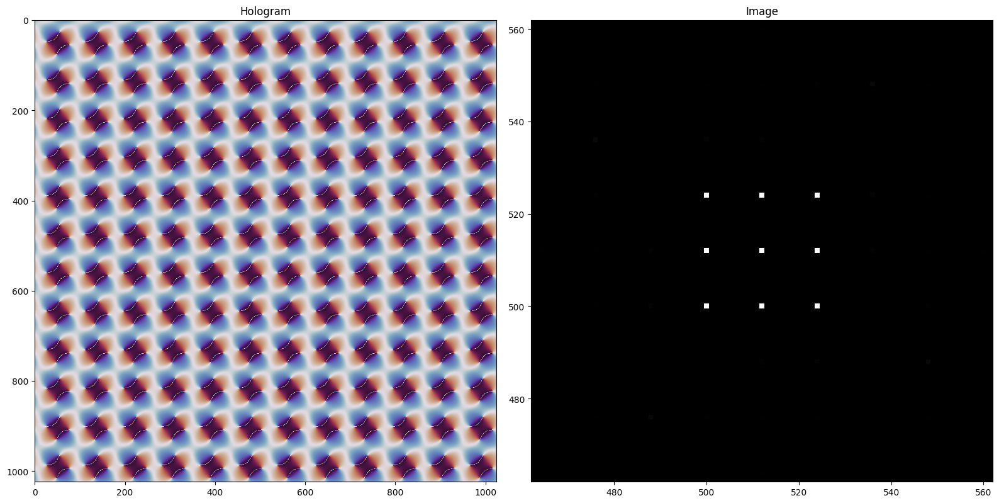

Time elapsed: 4786.966799999987 ms



In [16]:
pmg.gpu.max_iter = 10000
pmg.mask = np.ones(pmg.spots.shape[0], dtype=bool)

t0 = timeit.default_timer()
hologram = pmg.calculateGSW(
    start_hologram=None,
    max_delta=1e-9,
    dev_delta=1e-9,
    dev_eff=1e-3,
    show_plot=True,
    save_path="./masks/hologram.bmp"
)

print(f"Time elapsed: {(timeit.default_timer() - t0) * 1000} ms\n")

## Analyze the spots from a hologram
With the function `readHologram()` one can provide a hologram to the PMG instance and let it search for the brightest `n_spots` pixels in the estimated tweezer pattern obtained by performing a Fourier transform with the illumination profile loaded in the PMG. If these are over a preset `intensity_threshold`, the function will recognize it as a tweezer and record the coordinates, intensity and optical phase. There is also a similar function `loadFromHologram()`, which will replace the current spots with the detected spots.

Note that the detection by default does not sort the spots. Therefore, it is important to stick to a convention with respect to sorting. We adopt a convention from low to high in coordinates.

In [17]:
ret = pmg.readHologram(hologram, n_spots=9)
print("X-values in the computational space (programmed):\n"+str(list(pmg.spots[:, 0].astype(int))))
print("Y-values in the computational space (programmed):\n"+str(list(pmg.spots[:, 1].astype(int))))
print("I-values in the computational space (programmed):\n"+str(list(pmg.spots[:, 3].astype(float))))
print("X-values in the computational space (detected):\n"+str(list(ret[:, 0].astype(int))))
print("Y-values in the computational space (detected):\n"+str(list(ret[:, 1].astype(int))))
print("I-values in the computational space (detected):\n"+str(list(ret[:, 3].astype(float))))

X-values in the computational space (programmed):
[1012, 1012, 1012, 0, 0, 0, 12, 12, 12]
Y-values in the computational space (programmed):
[1012, 0, 12, 1012, 0, 12, 1012, 0, 12]
I-values in the computational space (programmed):
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
X-values in the computational space (detected):
[1012, 1012, 1012, 0, 0, 0, 12, 12, 12]
Y-values in the computational space (detected):
[1012, 0, 12, 1012, 0, 12, 1012, 0, 12]
I-values in the computational space (detected):
[1.000000073252941, 0.9999999985036284, 1.00000015372005, 0.9999999745436782, 1.0000000090985497, 1.0000000411537253, 0.9999999337017209, 0.9999997577676553, 1.000000058258052]


## Save the phase mask
Next, we can also save the mask separately. We can add some lens phase and grating phase on top of it. We use typically now $47\lambda$ lens phase and a grating phase with period 8. Currently, these are added in a different place and we only save the bare hologram.

In [18]:
hologram_crop = hologram[
    int(max(pmg.height, pmg.width) // 2 - height // 2): int(max(pmg.height, pmg.width) // 2 + height // 2),
    int(max(pmg.height, pmg.width) // 2 - width // 2): int(max(pmg.height, pmg.width) // 2 + width // 2)
]

"""
One could also add other lenses on top of the hologram directly:

lens = np.array(
    Image.open("../Masks/lens_phase.bmp")
)
grating = np.array(
    Image.open("../Masks/gradient_8.bmp")
)
"""
total = ((hologram_crop + np.pi) / (2 * np.pi) * 255) % 256 
"""
In case you want to add other masks you can do that here:

total = (total + lens + grating) % 256
"""
phi_im = Image.fromarray(total.astype(np.uint8))
phi_im.save("./masks/hologram.bmp")

## Iterations with data from atoms
In the second part we assume one has taken data with a hologram on atoms and wishes to get rid of non-uniformities. For this, we perform iterations on the trap depths. Iterations between runs consist from a couple of different steps:
- 1) Measuring a site-specific trap depth
- 2) Fitting the data
- 3) Updating the projected amplitudes for the PMG and recalculating
- 4) Saving the phase mask

### 3. Update and recalculate
The first step after you have obtained a dataset is analysing the trap depth per ROI out of them. We shall ignore the way how to obtain a list of the trap depths, because one can do so in many ways and assume a measured relative intensity distrubition. Instead, we only focus on the updating procedure here. Let us take for example a really non-uniform sample.

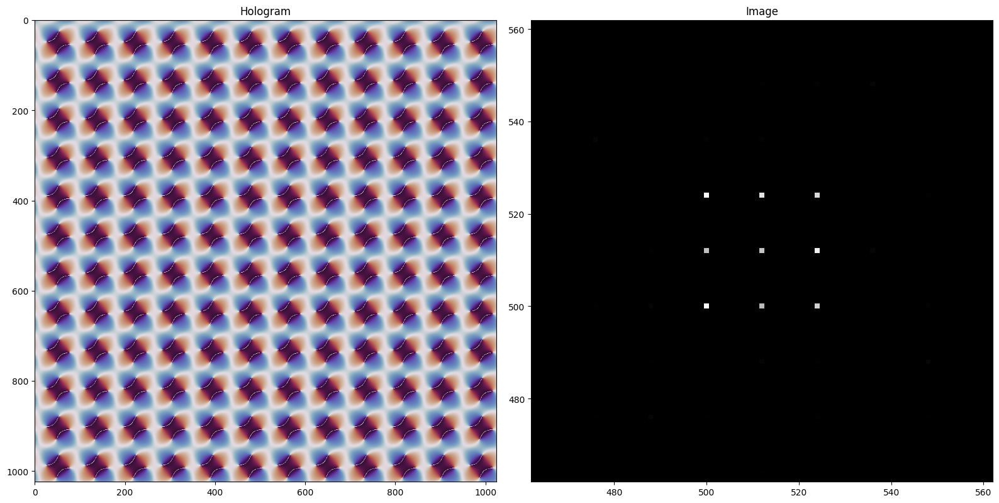

In [19]:
def calculate_target_intensities(old_intensities, measured_intensities, gain=0.85):
    target_intensities = old_intensities / np.mean(old_intensities) / (
        1 - gain * ( 1 - measured_intensities / np.mean(measured_intensities))
    )
    return target_intensities / np.mean(target_intensities)

measurement = np.asarray([
    0.8487089622929657, 1.1303997302479647, 0.8605467829281191, 
    1.1641333827917404, 1.107361741705235, 0.951352832965288, 
    1.0368541081386276, 0.9029229005052344, 0.9977195584248251
])
before = np.copy(pmg.spots[:, 3])

# Calculate the necessary intensities to go from measurement to before.
target = calculate_target_intensities(
    before,
    measurement,
    gain=1,
)
pmg.spots[:, 3] = target

# Recalculate hologram
pmg.mask = np.ones(pmg.spots.shape[0], dtype=bool)
hologram_iterated = pmg.calculateGSW(
    start_hologram=hologram,
    dev_delta=1e-5,
    dev_eff=1e-4,
    show_plot=True
)

ret = pmg.readHologram(hologram_iterated, n_spots=9)
after = np.copy(ret[:, 3])

# Reset to not mess up the notebook.
pmg.spots[:, 3] = before

We can test the effect of the produced pattern by plotting the measured intensities (blue), the intended spread before (orange), the newly calculated intensity (green) and the expected next measurement (red). The expectation is calculated as:

$$ \mathbb{E(I_i)} = \frac{I_{i-1}C_{i}}{\frac{1}{N}\sum{I_{i-1}C_{i}}},$$

where $I_i$ is the intensity measured in iteration $i$, $C_i$ is the computed intensity and $N$ is the number of tweezers. 

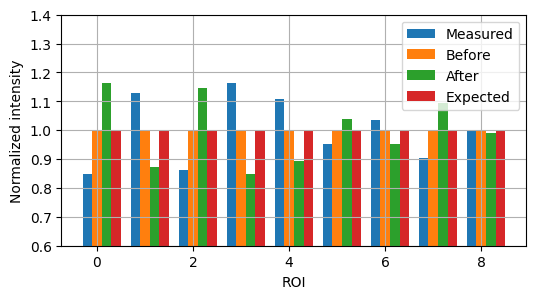

In [20]:
fig, ax = plt.subplots(figsize=(6,3))
ax.grid()
ax.bar(np.arange(measurement.shape[0])-0.2, measurement, width=0.2, label="Measured")
ax.bar(np.arange(measurement.shape[0]), before, width=0.2, label="Before")
ax.bar(np.arange(measurement.shape[0])+0.2, after, width=0.2, label="After")
ax.bar(np.arange(measurement.shape[0])+0.4, measurement*after/np.mean(measurement*after), width=0.2, label="Expected")

ax.set_ylim([0.6, 1.4])
ax.set_xlabel("ROI")
ax.set_ylabel("Normalized intensity")
ax.legend()
plt.show()

## Rearrange tweezers
In the last part of this notebook, we explore the option to rearrange tweezers. For this, the PMG has function `calculateSingle()`. Contrary to the `calculateGSW()`, this function does not iterate. Rather it does:

- Copy the target spots in the memory to the GPU buffers
- Define super bright spots in the field buffer to wash out any existing data
- Perform an iFFT
- Retrieve the phase information as a hologram

This is not normalized properly, but since we do only do a single iteration, this does not matter. Also, we do not perform an FFT back, so when placing the spots of the next iteration, the field buffer contains the electric field at the SLM. However, the amplitudes are small and when redefining the next spots with a very large amplitude, this becomes irrelevant noise. In principle, a single FFT back is very fast so one could do that, but then one needs to also remove the information about the previous locations of the tweezers.

We present an example of moving the 3x3 grid left 10 units.

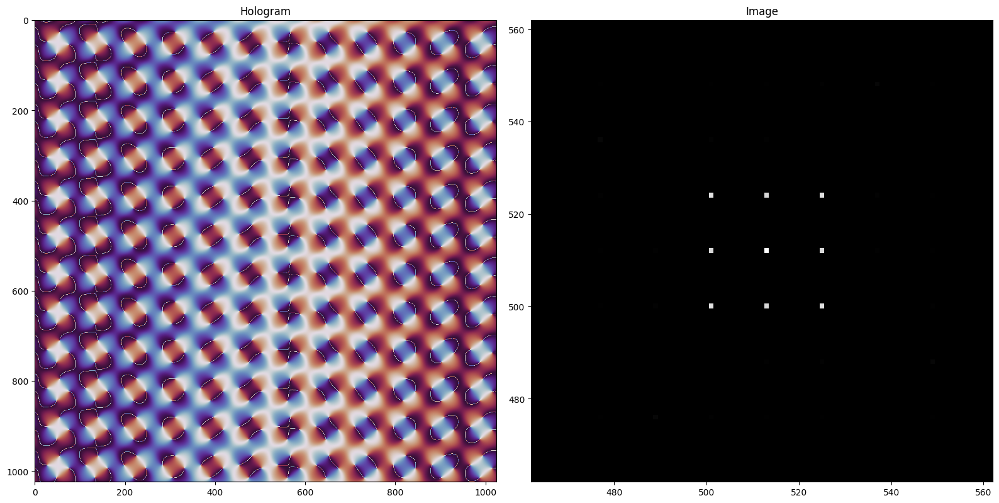

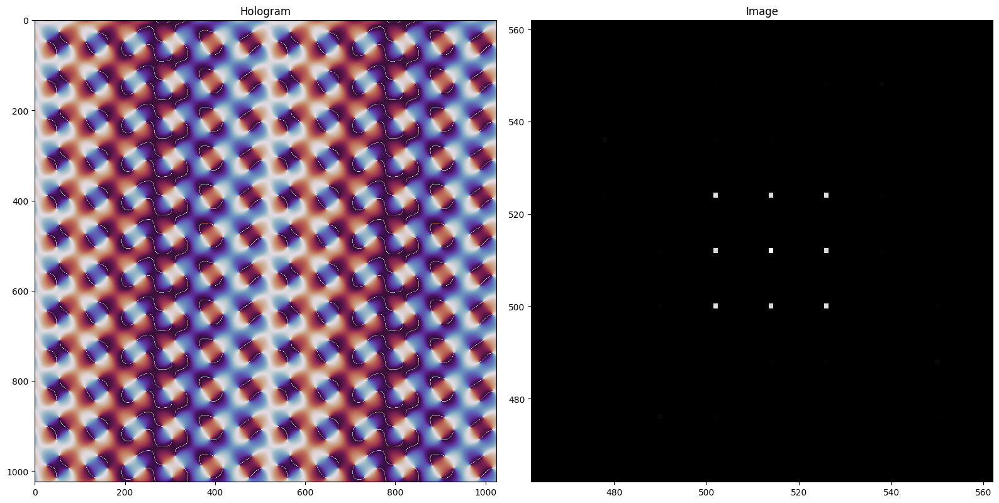

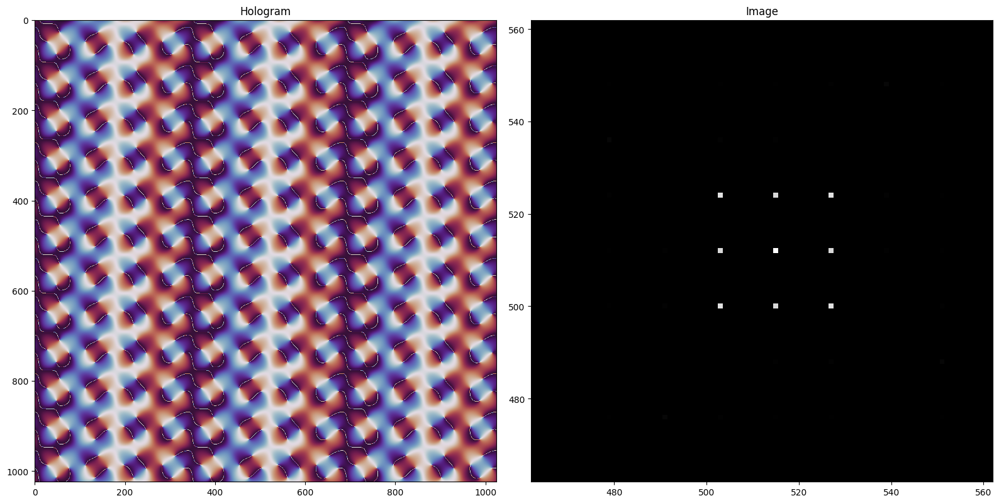

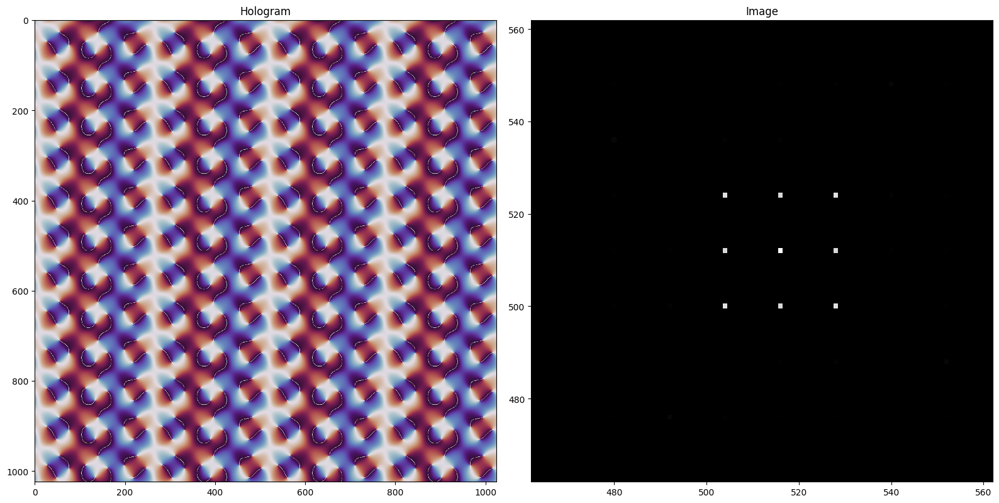

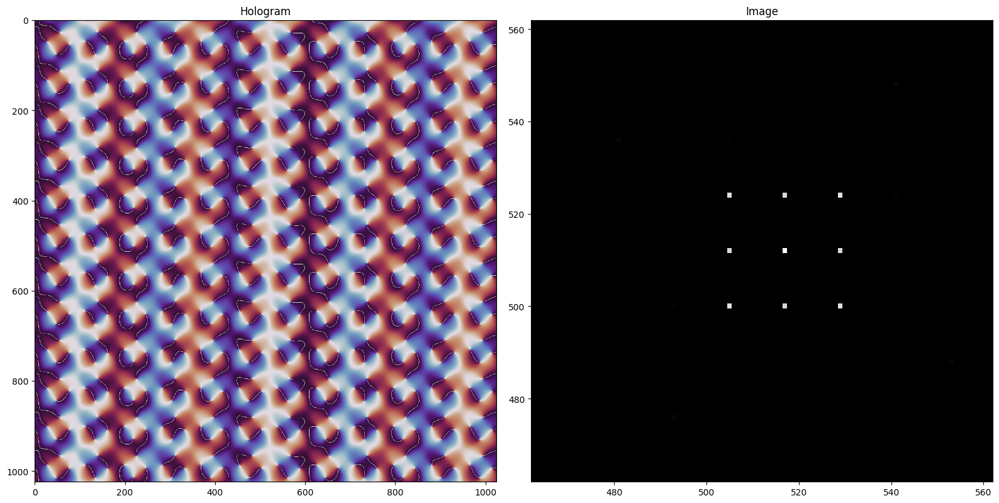

Exception ignored in: <function PhaseMaskGenerator.__del__ at 0x000001B0E5EB6310>
Traceback (most recent call last):
  File "C:\msys64\home\iknottn\SLMSorting\python\pyslmsorting\__init__.py", line 870, in __del__
    self.gpu.releaseBuffers()
  File "C:\msys64\home\iknottn\SLMSorting\python\pyslmsorting\__init__.py", line 286, in releaseBuffers
    self.field_buf.data.release()
pyopencl._cl.LogicError: MemoryObject.free failed: INVALID_VALUE - trying to double-unref mem object


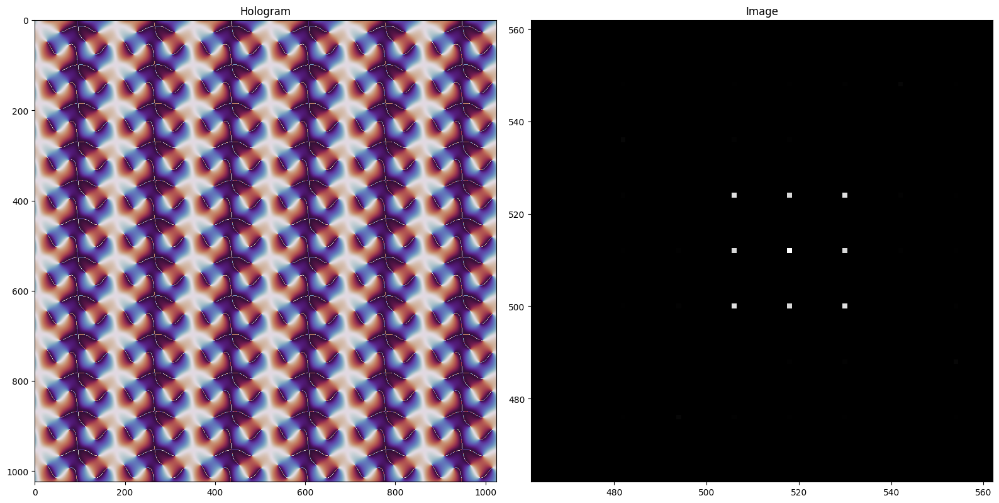

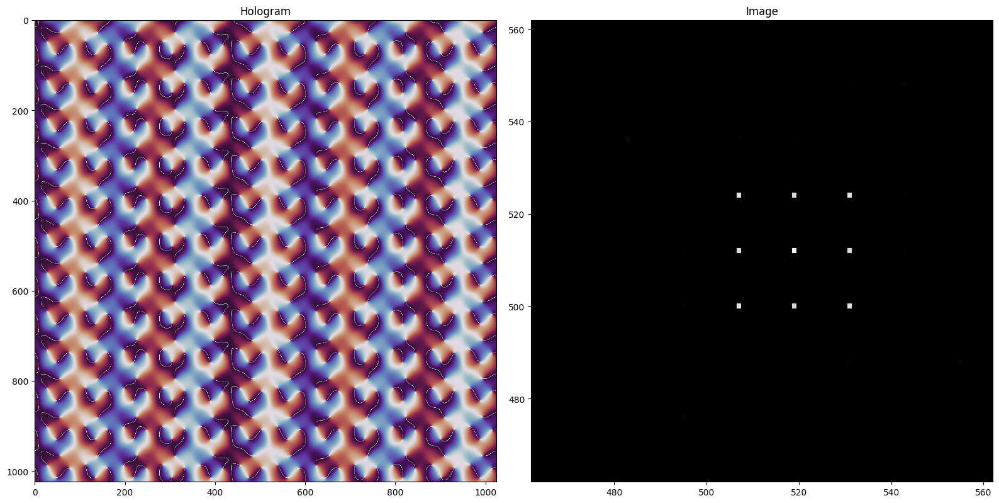

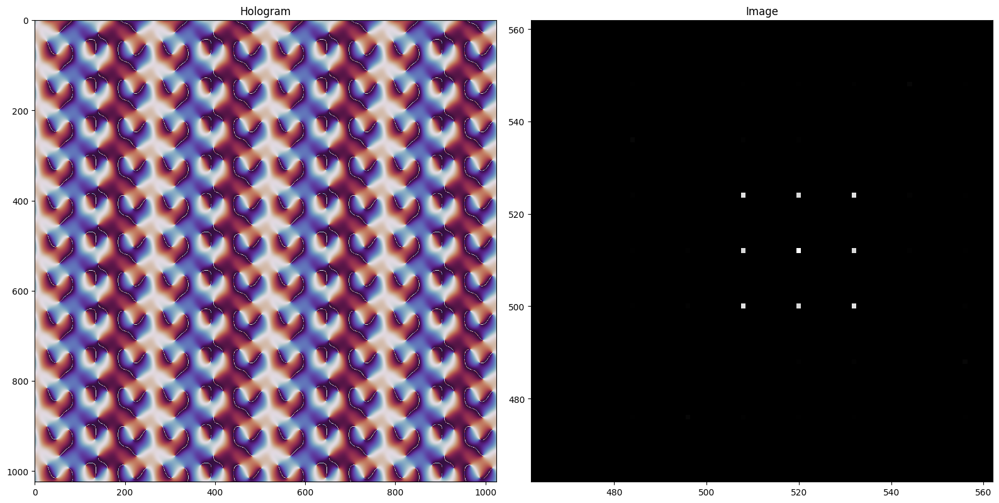

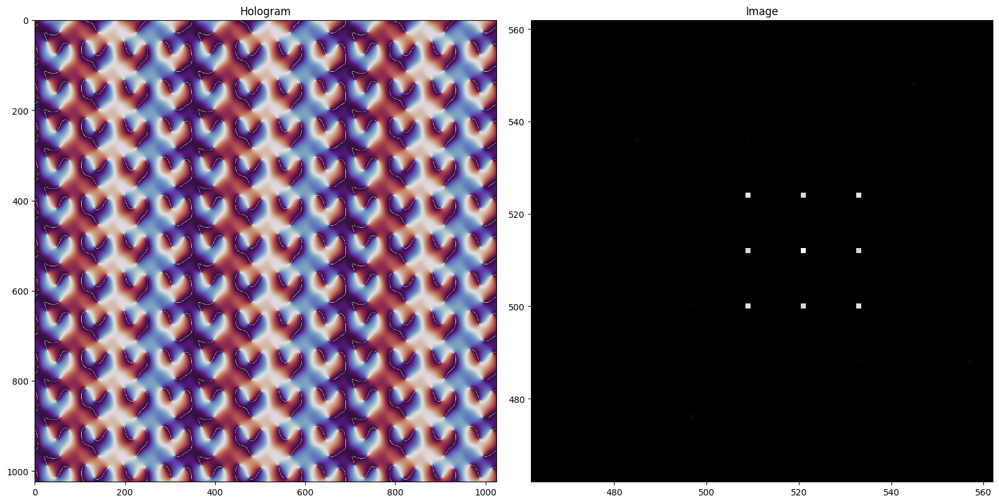

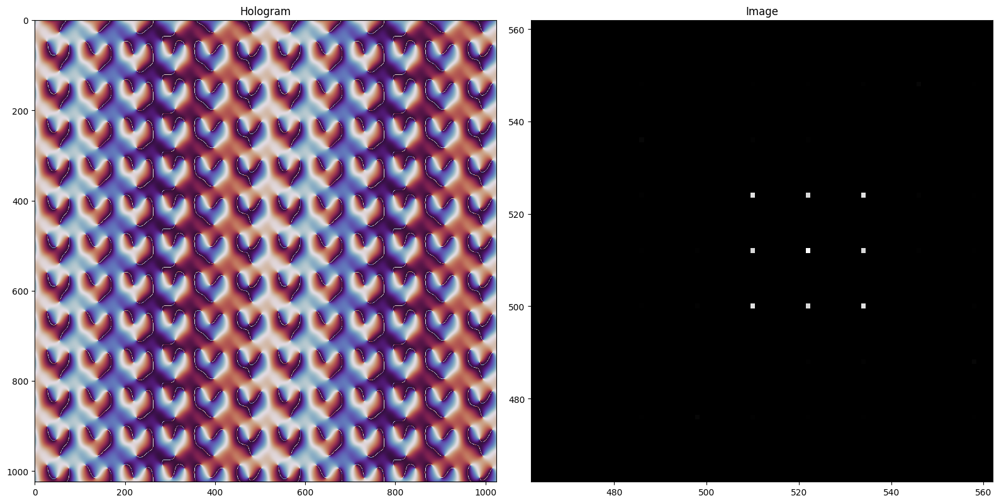

In [21]:
pmg.loadFromHologram(hologram, n_spots=9)
for i in range(10):
    pmg.spots[:, 0] = (pmg.spots[:, 0] + 1) % pmg.width
    pmg.calculateSingle(
        show_plot = True,
        save_path = f"./masks/translated_{i}.bmp"
    )
pmg.loadFromHologram(hologram, n_spots=9)